# Benchmark conditional mean estimation methods

Benchmark methods that estimate conditonal means of the form $E[Y|X=x]$

In [1]:
using QuadraticTeamDecisionSolver, Distributions, Statistics, LinearAlgebra, IterativeSolvers,  LaTeXStrings, Plots; pgfplotsx()

Plots.PGFPlotsXBackend()

In [2]:
saveTo = "/home/fe/michelena/Schreibtisch/";

### Noise distribution

Synthetic stochastic process of the form:
$$Y_t = D(t) + X_t$$
We get realizations of the form:
$$Y_i = D(t_i) + X_{t_i} + \varepsilon_i$$

In [3]:
D = Normal(0,0.5)

Normal{Float64}(μ=0.0, σ=0.5)

In [4]:
truth(x) = sin(2*pi*x);
measurements(x) = truth(x) + rand(D);

In [5]:
X = range(start=-1, stop=1, length=100);
Y = measurements.(X);

We do regularized regression so we set:
$$ \lambda = 0.3 $$

In [6]:
λ = 0.3;

## Linear regression

In [7]:
w = (X'*X + λ*I)\(X'*Y)

-0.37466573454708024

In [8]:
dpi=500

500

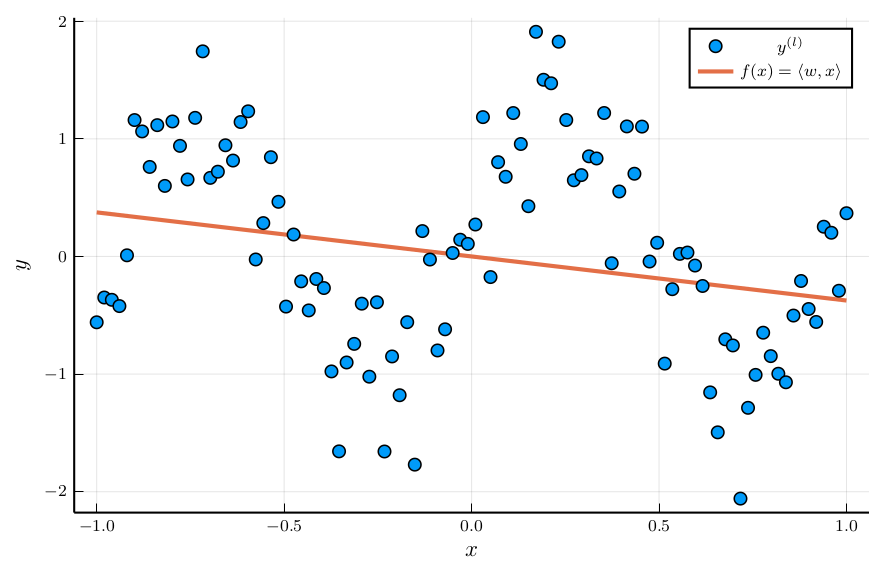

In [9]:
plot(X, Y, seriestype=:scatter, label=L"y^{(l)}", dpi=dpi);
plot!(X, w.*X, linewidth=2, label=L"f(x) = \langle w, x \rangle", legend=:topright, dpi=dpi)
xlabel!(L"x")
ylabel!(L"y")
savefig(saveTo * "/1d-linear.png")
display(Plots.current())


## Kernel Regression

In [10]:
kernel(x,y) = exponentialKernel(x, y, h=0.1);
K = gramian(kernel, collect(X));

In [11]:
w_kernel =  cg(K + λ*I,Y);
kernel_reg(x) = dot([kernel(x, u) for u in X], w_kernel)

kernel_reg (generic function with 1 method)

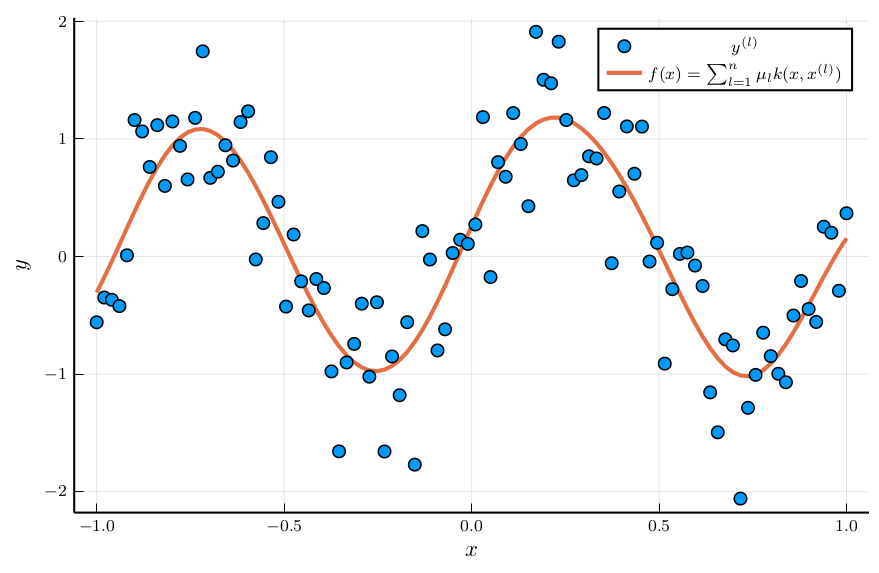

In [12]:
scatter(X, Y, label=L"y^{(l)}", dpi=dpi);
plot!(X, kernel_reg.(X), linewidth=2, label=L"f(x) = \sum_{l=1}^n \mu_l k(x,x^{(l)})", legend=:topright, dpi=dpi)
xlabel!(L"x")
ylabel!(L"y")
savefig(saveTo * "/1d-kernel.png")
display(Plots.current())

### Error Comparison

In [13]:
linear_error = norm(w.*X - truth.(X))

6.51788394591292

In [14]:
kernel_error =  norm(kernel_reg.(X) - truth.(X))

1.5021178433267495

## 2D Data 

In [15]:
truth2d(x,y) = sin(2*pi*x) + sin(2*pi*y);
measurements2d(x,y) = truth2d(x,y) + rand(D);

In [16]:
X2 = range(start=-1, stop=1, length=20);
X2d = [[x,y] for x in X2 for y in X2];
Y2d = [measurements2d(x[1],x[2]) for x in X2d];
x_coords = [point[1] for point in X2d];
y_coords = [point[2] for point in X2d];

### 2D linear regression

In [17]:
w_linear_2d = (X2d'X2d + λ*I)\(X2d'*Y2d)

1×2 adjoint(::Vector{Float64}) with eltype Float64:
 -0.19704  -0.180021

In [18]:
linear_sol_2d = X2d .|> x -> w_linear_2d*x;

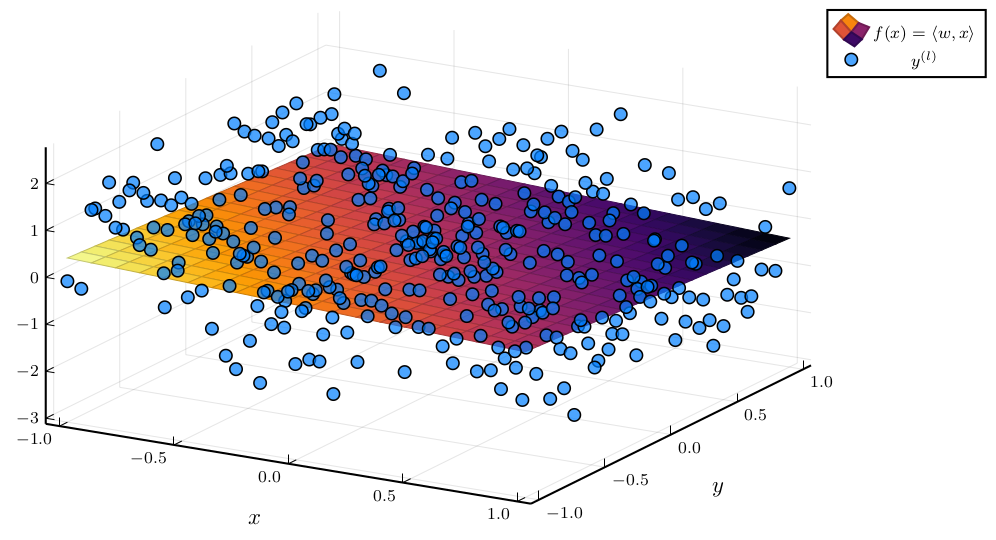

In [19]:
surface(x_coords, y_coords, linear_sol_2d, colorbar=false, label=L"f(x) = \langle w, x \rangle")
scatter3d!(x_coords, y_coords, Y2d, color=RGBA(0.0, 0.5, 1.0, 0.7), label=L"y^{(l)}")
xlabel!(L"x")
ylabel!(L"y")
savefig(saveTo * "/2d-linear.png")
display(Plots.current())

### 2D Kernel Regression

In [20]:
K2d = gramian(kernel, X2d);
w_kernel_2d = cg(K2d + λ*I,Y2d);
kernel_sol_2d(x, y) = dot([kernel([x,y], u) for u in X2d], w_kernel_2d)

kernel_sol_2d (generic function with 1 method)

In [21]:
kernel_sol_vector = vec(kernel_sol_2d.(X2',X2));

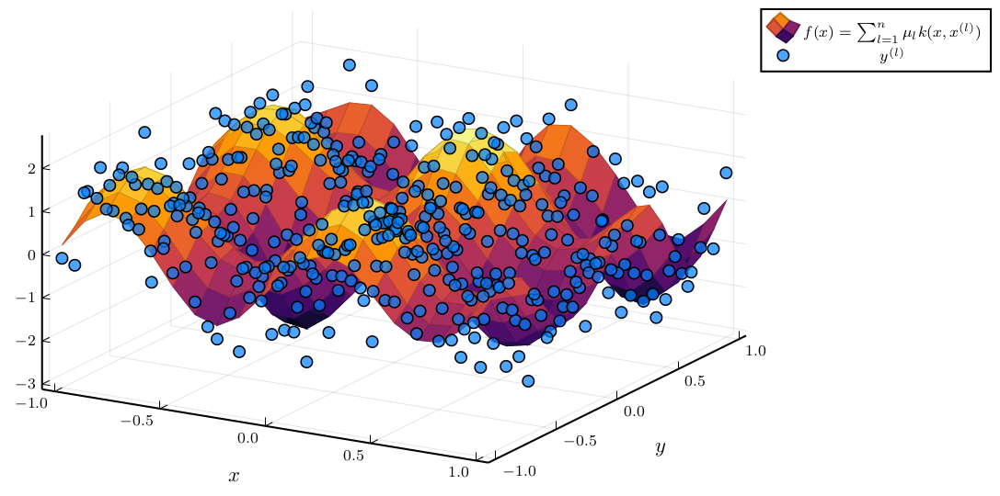

In [22]:
surface(x_coords, y_coords, kernel_sol_vector, label=L"f(x) = \sum_{l=1}^n \mu_l k(x,x^{(l)})", colorbar=false, legend=true);
scatter3d!(x_coords, y_coords, Y2d, color=RGBA(0.0, 0.5, 1.0, 0.7), label=L"y^{(l)}");
xlabel!(L"x")
ylabel!(L"y")
savefig(saveTo * "/2d-kernel.png")
display(Plots.current())

### Error Comparison

In [23]:
truthVector2d = [truth2d(x,y) for x in X for y in X];

In [24]:
linear_2d_error = norm(truthVector2d - linear_sol_2d)

DimensionMismatch: DimensionMismatch: dimensions must match: a has dims (Base.OneTo(10000),), b has dims (Base.OneTo(400),), mismatch at 1

In [25]:
kernel_2d_error = norm(truthVector2d - kernel_sol_vector)

DimensionMismatch: DimensionMismatch: dimensions must match: a has dims (Base.OneTo(10000),), b has dims (Base.OneTo(400),), mismatch at 1

# Complex Data

We take the same input data as in the previous scenario but then we add complex normal noise to the measurements and we also take one of the sines as complex.

By doing this we yield a function $f:\mathbb{C} \rightarrow \mathbb{C}$ which we wish to learn

In [26]:
truthComplex(z) = sin(2*pi*z);

In [27]:
Xcomplex = [x + y*im for x in X2 for y in X2];

In [28]:
Ycomplex =  vec(truthComplex.(Xcomplex) + sampleComplexNormal(0.0+0.0im, 0.5, 400, 1));

In [29]:
w_linear_complex =  (Xcomplex'*Xcomplex + λ*I)\(Xcomplex'*Ycomplex);
linear_sol_complex =  w_linear_complex'.*Xcomplex;

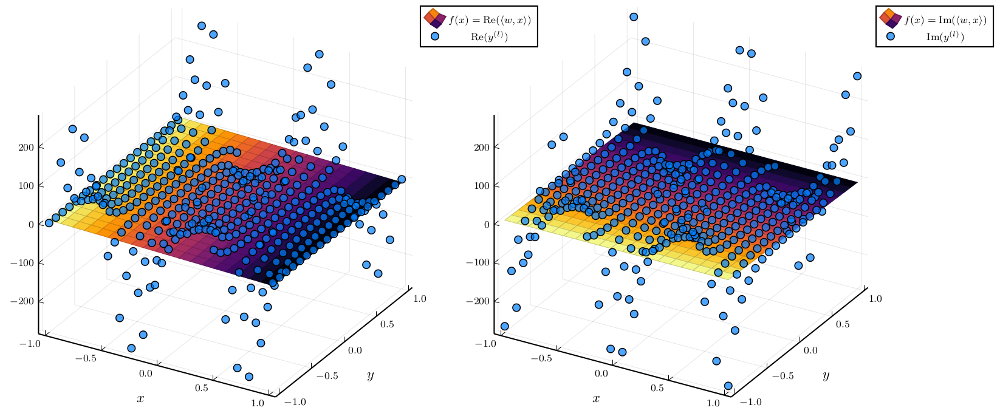

In [30]:
real_part_linear = surface(x_coords, y_coords, real(linear_sol_complex), colorbar=false, label=L"f(x) = \mathrm{Re}(\langle w,x \rangle)");
real_part_scatter = scatter3d!(x_coords, y_coords, real(Ycomplex),color=RGBA(0.0, 0.5, 1.0, 0.7), label=L"\mathrm{Re}(y^{(l)})");
xlabel!(L"x")
ylabel!(L"y")
imag_part_linear = surface(x_coords, y_coords, imag(linear_sol_complex), colorbar=false, label=L"f(x) = \mathrm{Im}(\langle w,x \rangle)");
imag_part_scatter = scatter3d!(x_coords, y_coords, imag(Ycomplex), color=RGBA(0.0, 0.5, 1.0, 0.7), label=L"\mathrm{Im}(y^{(l)})");
xlabel!(L"x")
ylabel!(L"y")
plot(real_part_scatter, imag_part_scatter, size=(1000,500))
savefig(saveTo * "/complex-linear.png")
display(Plots.current())

In [31]:
Kcomplex = gramian(kernel, Xcomplex);
w_kernel_complex = cg(Kcomplex + λ*I, Ycomplex);
kernel_sol_complex(z) = dot([kernel(z, u) for u in Xcomplex], w_kernel_complex);
kernel_sol_complex_vector = kernel_sol_complex.(Xcomplex);

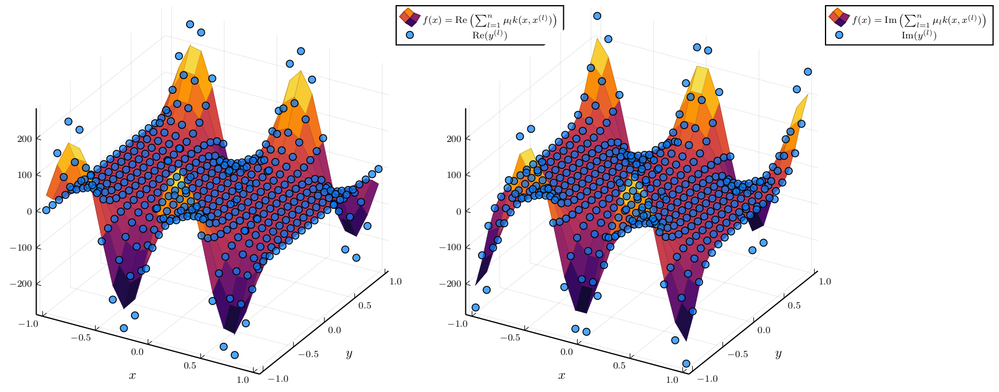

In [32]:
real_part_kernel = surface(x_coords, y_coords, real(kernel_sol_complex_vector), colorbar=false, label=L"f(x) = \mathrm{Re}\left(\sum_{l=1}^n \mu_l k(x,x^{(l)})\right)");
real_scatter = scatter3d!(x_coords, y_coords, real(Ycomplex),color=RGBA(0.0, 0.5, 1.0, 0.7), label=L"\mathrm{Re}(y^{(l)})");
xlabel!(L"x")
ylabel!(L"y")
imag_part_kernel = surface(x_coords, y_coords, imag(kernel_sol_complex_vector), colorbar=false, label=L"f(x) = \mathrm{Im}\left(\sum_{l=1}^n \mu_l k(x,x^{(l)})\right)");
imag_scatter = scatter3d!(x_coords, y_coords, imag(Ycomplex),color=RGBA(0.0, 0.5, 1.0, 0.7), label=L"\mathrm{Im}(y^{(l)})");
xlabel!(L"x")
ylabel!(L"y")
plot(real_scatter, imag_scatter, size=(1000,500))
savefig(saveTo * "/complex-kernel.png")
display(Plots.current())